


#Model No : 13


In [1]:
!lscpu

Architecture:                    x86_64
CPU op-mode(s):                  32-bit, 64-bit
Byte Order:                      Little Endian
Address sizes:                   46 bits physical, 48 bits virtual
CPU(s):                          4
On-line CPU(s) list:             0-3
Thread(s) per core:              2
Core(s) per socket:              2
Socket(s):                       1
NUMA node(s):                    1
Vendor ID:                       GenuineIntel
CPU family:                      6
Model:                           63
Model name:                      Intel(R) Xeon(R) CPU @ 2.30GHz
Stepping:                        0
CPU MHz:                         2299.998
BogoMIPS:                        4599.99
Hypervisor vendor:               KVM
Virtualization type:             full
L1d cache:                       64 KiB
L1i cache:                       64 KiB
L2 cache:                        512 KiB
L3 cache:                        45 MiB
NUMA node0 CPU(s):               0-3
Vulnerability 

In [2]:
!nvidia-smi

Wed Feb 15 17:27:38 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 510.47.03    Driver Version: 510.47.03    CUDA Version: 11.6     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   66C    P0    31W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [3]:
!pip install torch==1.10.0+cu111 torchvision==0.11.1+cu111 torchtext==0.11.0 -f https://download.pytorch.org/whl/torch_stable.html
!pip install mmcv-full==1.3.17 -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
!pip install mmdet==2.17.0
!pip install icevision[all]

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 GB 797.4 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.5/24.5 MB 49.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.0/8.0 MB 58.9 MB/s eta 0:00:00
  Attempting uninstall: torch
    Found existing installation: torch 1.13.1+cu116
    Uninstalling torch-1.13.1+cu116:
      Successfully uninstalled torch-1.13.1+cu116
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.14.1+cu116
    Uninstalling torchvision-0.14.1+cu116:
      Successfully uninstalled torchvision-0.14.1+cu116
  Attempting uninstall: torchtext
    Found existing installation: torchtext 0.14.1
    Uninstalling torchtext-0.14.1:
      Successfully uninstalled torchtext-0.14.1
ERROR: pip's dependency resolver does not currently take into a

In [4]:
# Restart kernel after installation
import IPython
IPython.Application.instance().kernel.do_shutdown(True)

{'status': 'ok', 'restart': True}

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
!pip install gdown -U

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Attempting uninstall: gdown
    Found existing installation: gdown 4.4.0
    Uninstalling gdown-4.4.0:
      Successfully uninstalled gdown-4.4.0


In [1]:
!gdown '1wRPk6dK1E486ZfszKaD6yT_FdB4GtK0d'

Downloading...
From: https://drive.google.com/uc?id=1wRPk6dK1E486ZfszKaD6yT_FdB4GtK0d
To: /content/COCONUT.zip
100% 32.8M/32.8M [00:01<00:00, 22.9MB/s]


In [2]:
!gdown "1CmFs5Q422jeDNkh--9Rpf2n69tIlHrBH"

Downloading...
From: https://drive.google.com/uc?id=1CmFs5Q422jeDNkh--9Rpf2n69tIlHrBH
To: /content/Copy of test_VOC.zip
100% 7.02M/7.02M [00:00<00:00, 101MB/s]


In [3]:
!unzip -qq "COCONUT.zip"

In [4]:
!unzip -qq "Copy of test_VOC.zip"

In [5]:
!pip install sahi==0.10.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.5/95.5 KB 4.1 MB/s eta 0:00:00
  Attempting uninstall: sahi
    Found existing installation: sahi 0.11.11
    Uninstalling sahi-0.11.11:
      Successfully uninstalled sahi-0.11.11


In [6]:
from icevision.all import *
import warnings
warnings.filterwarnings('ignore')
from fastai.callback.tracker import SaveModelCallback
import glob, os, shutil

INFO     - Downloading default `.ttf` font file - SpaceGrotesk-Medium.ttf from https://raw.githubusercontent.com/airctic/storage/master/SpaceGrotesk-Medium.ttf to /root/.icevision/fonts/SpaceGrotesk-Medium.ttf | icevision.visualize.utils:get_default_font:67
INFO     - Downloading mmdet configs | icevision.models.mmdet.download_configs:download_mmdet_configs:31


  0%|          | 0/1837152 [00:00<?, ?B/s]

In [7]:
data_dir = "/content/test_VOC"

# Create the parser
parser = parsers.VOCBBoxParser(annotations_dir=data_dir, images_dir=data_dir)

# Parse annotations to create records
train_records, valid_records = parser.parse()

  0%|          | 0/501 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/501 [00:00<?, ?it/s]

AUTOFIX-SUCCESS - (record_id: 000000_jpg.rf.d28af308cd3ea352827598e04f2efcef) - Clipping bbox ymax from 225 to image height 224 (Before: <BBox (xmin:1, ymin:169, xmax:73, ymax:225)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 000001_jpg.rf.a59008af1bc9d8d06f9f797f537879ff) - Clipping bbox xmax from 225 to image width 224 (Before: <BBox (xmin:167, ymin:55, xmax:225, ymax:145)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 000002_jpg.rf.2a910b672ce554583d5fe72ace60dea0) - Clipping bbox xmax from 225 to image width 224 (Before: <BBox (xmin:142, ymin:157, xmax:225, ymax:225)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 000002_jpg.rf.2a910b672ce554583d5fe72ace60dea0) - Clipping bbox ymax from 225 to image height 224 (Before: <BBox (xmin:142, ymin:157, xmax:224, ymax:225)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 000002_jpg.rf.2a910b672ce554583d5fe72ace60dea0) 

In [8]:
parser.class_map

<ClassMap: {'background': 0, 'coconut': 1}>

In [9]:
# Transforms
# size is set to 384 because EfficientDet requires its inputs to be divisible by 128
image_size = 640


train_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])

In [10]:
# Datasets
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

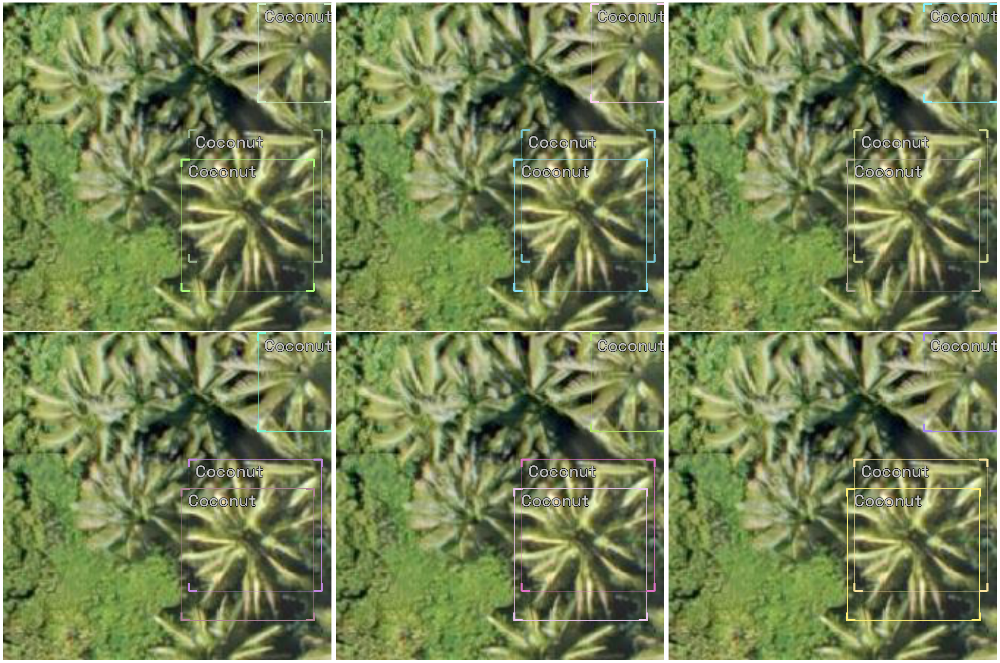

In [11]:
# Show an element of the train_ds with augmentation transformations applied
samples = [train_ds[0] for _ in range(6)]
show_samples(samples, ncols=3)

1,2,5,6,7,11-15

In [12]:
# Just change the value of selection to try another model

selection = 13

extra_args = {}

if selection == 0:
  model_type = models.mmdet.vfnet
  backbone = model_type.backbones.resnet50_fpn_mstrain_2x

if selection == 1:
  model_type = models.mmdet.retinanet
  backbone = model_type.backbones.resnet50_fpn_1x
  # extra_args['cfg_options'] = { 
  #   'model.bbox_head.loss_bbox.loss_weight': 2,
  #   'model.bbox_head.loss_cls.loss_weight': 0.8,
  #    }

if selection == 2:
  model_type = models.mmdet.faster_rcnn
  backbone = model_type.backbones.resnet101_fpn_2x
  # extra_args['cfg_options'] = { 
  #   'model.roi_head.bbox_head.loss_bbox.loss_weight': 2,
  #   'model.roi_head.bbox_head.loss_cls.loss_weight': 0.8,
  #    }

if selection == 3:
  model_type = models.mmdet.ssd
  backbone = model_type.backbones.ssd300

if selection == 4:
  model_type = models.mmdet.yolox
  backbone = model_type.backbones.yolox_s_8x8

if selection == 5:
  model_type = models.mmdet.yolof
  backbone = model_type.backbones.yolof_r50_c5_8x8_1x_coco

if selection == 6:
  model_type = models.mmdet.detr #This can e tried as it works on small object
  backbone = model_type.backbones.r50_8x2_150e_coco

if selection == 7:
  model_type = models.mmdet.deformable_detr
  backbone = model_type.backbones.twostage_refine_r50_16x2_50e_coco

if selection == 8:
  model_type = models.mmdet.fsaf
  backbone = model_type.backbones.x101_64x4d_fpn_1x_coco

if selection == 9:
  model_type = models.mmdet.sabl
  backbone = model_type.backbones.r101_fpn_gn_2x_ms_640_800_coco

if selection == 10:
  model_type = models.mmdet.centripetalnet
  backbone = model_type.backbones.hourglass104_mstest_16x6_210e_coco

elif selection == 11:
  # The Retinanet model is also implemented in the torchvision library
  model_type = models.torchvision.retinanet
  backbone = model_type.backbones.resnet50_fpn

elif selection == 12:
  model_type = models.ross.efficientdet
  backbone = model_type.backbones.tf_lite0
  # The efficientdet model requires an img_size parameter
  extra_args['img_size'] = image_size

elif selection == 13: #Mobile Deployment
  model_type = models.ultralytics.yolov5
  backbone = model_type.backbones.small
  # The yolov5 model requires an img_size parameter
  extra_args['img_size'] = image_size

elif selection == 14: #Best as of now
  model_type = models.mmdet.vfnet
  backbone = model_type.backbones.swin_t_p4_w7_fpn_1x_coco

elif selection == 15: #2nd Best
  model_type = models.mmdet.vfnet
  backbone = model_type.backbones.resnet50_fpn_mstrain_2x  

model_type, backbone, extra_args

(<module 'icevision.models.ultralytics.yolov5' from '/usr/local/lib/python3.8/dist-packages/icevision/models/ultralytics/yolov5/__init__.py'>,
 {'img_size': 640})

In [13]:
# Instantiate the model
model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(parser.class_map), **extra_args)

  0%|          | 0.00/14.1M [00:00<?, ?B/s]

In [14]:
# Data Loaders
train_dl = model_type.train_dl(train_ds, batch_size=4, num_workers=8, shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=4, num_workers=8, shuffle=False)

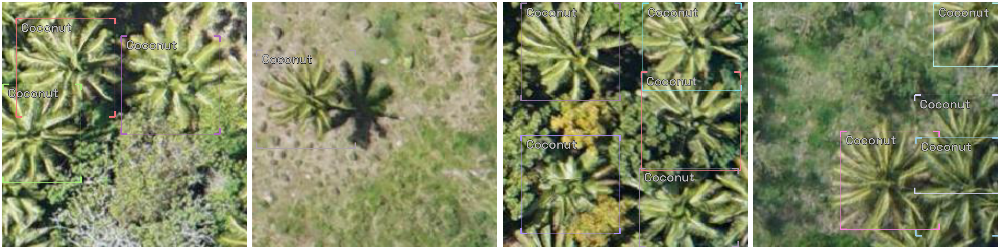

In [15]:
# show batch
model_type.show_batch(first(valid_dl), ncols=4)

In [16]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox, print_summary=True)]

In [17]:
learn = model_type.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics, cbs=[SaveModelCallback(fname='/content/cheque_yolov5_medium')])

In [18]:
learn.save('test')

Path('models/test.pth')

In [19]:
import time
begin = time.time()

learn.fine_tune(150, 1e-3, freeze_epochs=15)
end = time.time()

epoch,train_loss,valid_loss,COCOMetric,time
0,0.180787,0.169609,0.002192,00:19
1,0.155306,0.146630,0.010136,00:14
2,0.128111,0.121039,0.022426,00:14
3,0.108709,0.107478,0.034930,00:14
4,0.098787,0.101884,0.042663,00:14
5,0.093151,0.098031,0.054993,00:14
6,0.087753,0.093500,0.060895,00:14
7,0.085126,0.090766,0.072039,00:14
8,0.080643,0.088594,0.071576,00:13
9,0.080751,0.087342,0.081311,00:13


 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.002
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.012
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.002
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.004
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.013
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.162
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.162
Better model found at epoch 0 with v

epoch,train_loss,valid_loss,COCOMetric,time
0,0.070465,0.076715,0.160663,00:18
1,0.069023,0.075234,0.207449,00:17
2,0.065968,0.072615,0.238419,00:17
3,0.062835,0.071034,0.267733,00:17
4,0.060283,0.069536,0.292715,00:17
5,0.057198,0.067776,0.329685,00:17
6,0.054461,0.066114,0.360713,00:17
7,0.054401,0.065932,0.358689,00:17
8,0.052562,0.063317,0.390794,00:17
9,0.050910,0.063130,0.413585,00:17


 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.161
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.369
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.089
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.161
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.139
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.383
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.566
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.566
Better model found at epoch 0 with v

In [20]:
print(f"Total runtime of the program is {end - begin}")

Total runtime of the program is 2778.625663280487


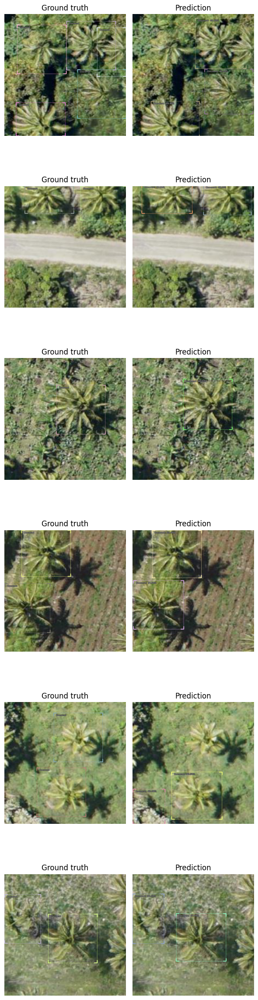

In [21]:
model_type.show_results(model, valid_ds, detection_threshold=.4)

In [22]:
data_dir = "/content/COCONUT"
spliter =RandomSplitter([0, 0, 1.0], seed=42)
parser = parsers.VOCBBoxParser(annotations_dir=data_dir, images_dir=data_dir)
_,_,test_records = parser.parse(spliter)
image_size = 640

test_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])
test_ds = Dataset(test_records, test_tfms)

  0%|          | 0/379 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/379 [00:00<?, ?it/s]

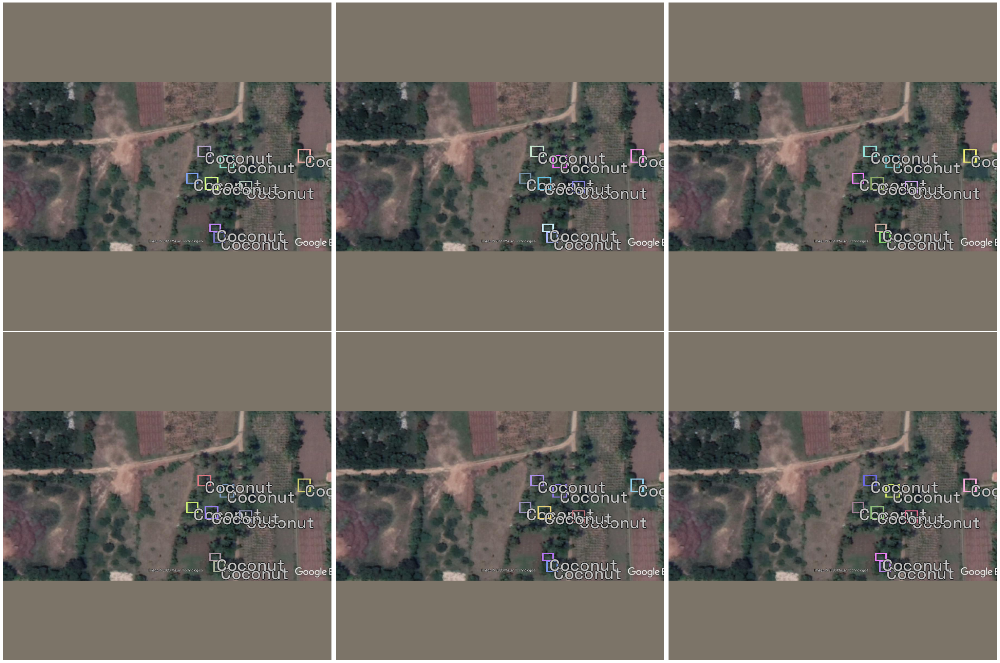

In [23]:
# Show an element of the train_ds with augmentation transformations applied
samples = [test_ds[0] for _ in range(6)]
show_samples(samples, ncols=3)

In [24]:
test_dl = model_type.valid_dl(test_ds, batch_size=4, num_workers=8, shuffle=False)

# Test Accuracy

In [25]:
learn.validate(dl=test_dl) 

 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
Better model found at epoch 0 with valid

(#2) [0.6061703562736511,0.0]

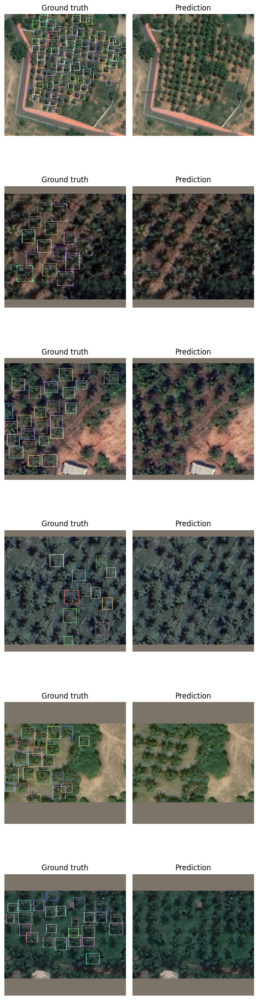

In [26]:
model_type.show_results(model, test_ds, detection_threshold=.4)

# Train Accuracy

In [27]:
learn.validate()

 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.434
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.797
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.423
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.434
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.233
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.610
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.656
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.656
Better model found at epoch 0 with v

(#2) [0.05887254700064659,0.4344754769332629]

  model_type = models.torchvision.retinanet
  backbone = model_type.backbones.resnet50_fpn
  

# Change model No in model_no.zip

In [28]:
import os

path = "/content/drive/MyDrive/Model_13"
os.mkdir(path)

In [ ]:
# change path

In [29]:
!cp /content/models/test.pth /content/drive/MyDrive/Model_13

# Saving Metadata

In [30]:
from icevision.all import *
import warnings
warnings.filterwarnings('ignore')
from fastai.callback.tracker import SaveModelCallback
import glob, os, shutil

In [31]:
from icevision.models import *

model_type = models.ultralytics.yolov5
  backbone = model_type.backbones.small

In [32]:
# How to save a model and its metadata
checkpoint_path = '/content/full_model13.pth'
save_icevision_checkpoint(model, 
                        model_name='ultralytics.yolov5', 
                        backbone_name='small',
                        classes =  parser.class_map.get_classes(), 
                        img_size=image_size, 
                        filename=checkpoint_path,
                        meta={'icevision_version': '0.9.1'})

In [33]:
!cp /content/full_model13.pth /content/drive/MyDrive/Model_13